<a href="https://colab.research.google.com/github/raizo2000/Machine-Learning/blob/COVID/covid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Tratamiento de datos
# ==============================================================================
import pandas as pd
import numpy as np
import os
import glob

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.pyplot as plt
from sklearn import preprocessing

import seaborn as sns

1) Recepción datos CSV

2) Cree un ambiente en Anaconda

3) Análisis metadatos, núm .registros y medidas Estadística Descriptiva con Pandas

In [ ]:
data_global= pd.read_csv('covidGlobal/time_series_covid19_confirmed_global.csv')
data_dead= pd.read_csv('covidGlobal/time_series_covid19_deaths_global.csv')

data_us= pd.read_csv('covidUS/time_series_covid19_confirmed_US.csv')
data_deadUS= pd.read_csv('covidUS/time_series_covid19_deaths_US.csv')

data_recover= pd.read_csv('covidRecover/time_series_covid19_recovered_global.csv')

In [ ]:

print('=======================================================================')
print(data_global.info())
print('=======================================================================')
print(data_global.describe())
print('=======================================================================')
data_global.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271 entries, 0 to 270
Columns: 338 entries, Province/State to 12/20/20
dtypes: float64(2), int64(334), object(2)
memory usage: 715.7+ KB
None
              Lat        Long     1/22/20     1/23/20     1/24/20     1/25/20  \
count  270.000000  270.000000  271.000000  271.000000  271.000000  271.000000   
mean    20.817839   23.439277    2.047970    2.413284    3.472325    5.291513   
std     25.171460   72.529836   27.026899   27.125204   33.769345   46.999290   
min    -51.796300 -172.104600    0.000000    0.000000    0.000000    0.000000   
25%      6.424864  -18.093125    0.000000    0.000000    0.000000    0.000000   
50%     22.041450   20.972650    0.000000    0.000000    0.000000    0.000000   
75%     41.143200   83.380449    0.000000    0.000000    0.000000    0.000000   
max     71.706900  178.065000  444.000000  444.000000  549.000000  761.000000   

           1/26/20      1/27/20      1/28/20      1/29/20  ...      12/11/20  

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,48116,48229,48527,48718,48952,49161,49378,49621,49681,49817
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,46863,47742,48530,49191,50000,50637,51424,52004,52542,53003
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,91121,91638,92102,92597,93065,93507,93933,94371,94781,95203
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,7236,7288,7338,7382,7382,7446,7466,7519,7560,7577
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,16061,16161,16188,16277,16362,16407,16484,16562,16626,16644


In [ ]:

print('=======================================================================')
print(data_us.info())
print('=======================================================================')
print(data_us.describe())
print('=======================================================================')
data_us.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3340 entries, 0 to 3339
Columns: 345 entries, UID to 12/20/20
dtypes: float64(3), int64(336), object(6)
memory usage: 8.8+ MB
None
                UID        code3          FIPS          Lat        Long_  \
count  3.340000e+03  3340.000000   3330.000000  3340.000000  3340.000000   
mean   8.342958e+07   834.491617  33061.684685    36.707212   -88.601474   
std    4.315345e+06    36.498055  18638.940791     9.062922    21.718982   
min    1.600000e+01    16.000000     60.000000   -14.271000  -174.159600   
25%    8.401811e+07   840.000000  19079.500000    33.895587   -97.790204   
50%    8.402921e+07   840.000000  31014.000000    38.002344   -89.486710   
75%    8.404612e+07   840.000000  47130.500000    41.573069   -82.311265   
max    8.410000e+07   850.000000  99999.000000    69.314792   145.673900   

           1/22/20      1/23/20      1/24/20      1/25/20      1/26/20  ...  \
count  3340.000000  3340.000000  3340.000000  3340.0000

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,3233,3258,3300,3329,3426,3510,3570,3647,3698,3741
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,10489,10665,10806,10898,11061,11212,11364,11556,11722,11827
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,1264,1269,1272,1275,1292,1296,1309,1318,1330,1336
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,1398,1417,1441,1455,1504,1520,1548,1577,1601,1613
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,3663,3744,3776,3803,3881,3950,4036,4118,4191,4218


In [ ]:

print('=======================================================================')
print(data_dead.info())
print('=======================================================================')
print(data_dead.describe())
print('=======================================================================')
data_dead.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271 entries, 0 to 270
Columns: 338 entries, Province/State to 12/20/20
dtypes: float64(2), int64(334), object(2)
memory usage: 715.7+ KB
None
              Lat        Long     1/22/20     1/23/20     1/24/20     1/25/20  \
count  270.000000  270.000000  271.000000  271.000000  271.000000  271.000000   
mean    20.817839   23.439277    0.062731    0.066421    0.095941    0.154982   
std     25.171460   72.529836    1.032676    1.034237    1.459966    2.430890   
min    -51.796300 -172.104600    0.000000    0.000000    0.000000    0.000000   
25%      6.424864  -18.093125    0.000000    0.000000    0.000000    0.000000   
50%     22.041450   20.972650    0.000000    0.000000    0.000000    0.000000   
75%     41.143200   83.380449    0.000000    0.000000    0.000000    0.000000   
max     71.706900  178.065000   17.000000   17.000000   24.000000   40.000000   

          1/26/20     1/27/20     1/28/20     1/29/20  ...       12/11/20  \
c

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,1945,1956,1965,1969,1995,2011,2025,2030,2047,2067
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,977,989,1003,1016,1028,1040,1055,1066,1074,1088
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,2575,2584,2596,2609,2623,2631,2640,2647,2659,2666
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,78,78,79,79,79,79,79,80,80,81
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,365,366,371,372,372,379,382,384,386,387


In [ ]:

print('=======================================================================')
print(data_deadUS.info())
print('=======================================================================')
print(data_deadUS.describe())
print('=======================================================================')
data_deadUS.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3340 entries, 0 to 3339
Columns: 346 entries, UID to 12/20/20
dtypes: float64(3), int64(337), object(6)
memory usage: 8.8+ MB
None
                UID        code3          FIPS          Lat        Long_  \
count  3.340000e+03  3340.000000   3330.000000  3340.000000  3340.000000   
mean   8.342958e+07   834.491617  33061.684685    36.707212   -88.601474   
std    4.315345e+06    36.498055  18638.940791     9.062922    21.718982   
min    1.600000e+01    16.000000     60.000000   -14.271000  -174.159600   
25%    8.401811e+07   840.000000  19079.500000    33.895587   -97.790204   
50%    8.402921e+07   840.000000  31014.000000    38.002344   -89.486710   
75%    8.404612e+07   840.000000  47130.500000    41.573069   -82.311265   
max    8.410000e+07   850.000000  99999.000000    69.314792   145.673900   

         Population  1/22/20  1/23/20  1/24/20  1/25/20  ...     12/11/20  \
count  3.340000e+03   3340.0   3340.0   3340.0   3340.0  

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,42,41,41,41,43,43,43,44,44,44
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,141,141,141,141,141,145,145,146,147,147
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,30,30,30,30,30,30,30,30,32,32
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,40,40,40,40,39,42,42,42,42,42
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,47,47,47,47,49,50,52,52,54,54


In [ ]:
print('=======================================================================')
print(data_recover.info())
print('=======================================================================')
print(data_recover.describe())
print('=======================================================================')
data_recover.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 256 entries, 0 to 255
Columns: 338 entries, Province/State to 12/20/20
dtypes: float64(2), int64(334), object(2)
memory usage: 676.1+ KB
None
              Lat        Long     1/22/20     1/23/20     1/24/20     1/25/20  \
count  256.000000  256.000000  256.000000  256.000000  256.000000  256.000000   
mean    19.384470   28.993512    0.109375    0.117188    0.140625    0.152344   
std     24.626381   69.698234    1.750000    1.753970    1.943251    2.008861   
min    -51.796300 -172.104600    0.000000    0.000000    0.000000    0.000000   
25%      5.079216   -7.825200    0.000000    0.000000    0.000000    0.000000   
50%     20.800792   24.644050    0.000000    0.000000    0.000000    0.000000   
75%     39.132000   90.375625    0.000000    0.000000    0.000000    0.000000   
max     71.706900  178.065000   28.000000   28.000000   31.000000   32.000000   

          1/26/20     1/27/20     1/28/20     1/29/20  ...      12/11/20  \
co

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,38141,38200,38250,38252,38336,38475,38505,38540,38613,39006
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,24136,24520,24820,24820,25876,26381,26898,27426,27831,28121
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,59590,60028,60457,60888,61307,61700,62089,62487,62869,63260
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,6598,6629,6629,6706,6706,6819,6875,6919,6963,6997
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,8798,8841,8898,8924,8990,9194,9266,9345,9518,9592


In [ ]:
dataG= pd.read_csv('covidGlobal/combined_global.csv')
dataU= pd.read_csv('covidUS/combined_us.csv')

In [ ]:
print('=======================================================================')
print(dataG.info())
print('=======================================================================')
print(dataG.describe())
print('=======================================================================')
dataG.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 542 entries, 0 to 541
Columns: 338 entries, Province/State to 12/20/20
dtypes: float64(2), int64(334), object(2)
memory usage: 1.4+ MB
None
              Lat        Long     1/22/20     1/23/20     1/24/20     1/25/20  \
count  540.000000  540.000000  542.000000  542.000000  542.000000  542.000000   
mean    20.817839   23.439277    1.055351    1.239852    1.784133    2.723247   
std     25.148099   72.462522   19.132979   19.212539   23.938451   33.346400   
min    -51.796300 -172.104600    0.000000    0.000000    0.000000    0.000000   
25%      6.423800  -19.020800    0.000000    0.000000    0.000000    0.000000   
50%     22.041450   20.972650    0.000000    0.000000    0.000000    0.000000   
75%     41.153300   84.250000    0.000000    0.000000    0.000000    0.000000   
max     71.706900  178.065000  444.000000  444.000000  549.000000  761.000000   

           1/26/20      1/27/20      1/28/20      1/29/20  ...      12/11/20  \


,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,48116,48229,48527,48718,48952,49161,49378,49621,49681,49817
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,46863,47742,48530,49191,50000,50637,51424,52004,52542,53003
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,91121,91638,92102,92597,93065,93507,93933,94371,94781,95203
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,7236,7288,7338,7382,7382,7446,7466,7519,7560,7577
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,16061,16161,16188,16277,16362,16407,16484,16562,16626,16644


In [ ]:
print('=======================================================================')
print(dataU.info())
print('=======================================================================')
print(dataU.describe())
print('=======================================================================')
dataU.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6680 entries, 0 to 6679
Columns: 346 entries, UID to Population
dtypes: float64(4), int64(336), object(6)
memory usage: 17.6+ MB
None
                UID        code3          FIPS          Lat        Long_  \
count  6.680000e+03  6680.000000   6660.000000  6680.000000  6680.000000   
mean   8.342958e+07   834.491617  33061.684685    36.707212   -88.601474   
std    4.315022e+06    36.495323  18637.541209     9.062243    21.717356   
min    1.600000e+01    16.000000     60.000000   -14.271000  -174.159600   
25%    8.401811e+07   840.000000  19079.000000    33.895587   -97.790204   
50%    8.402921e+07   840.000000  31014.000000    38.002344   -89.486710   
75%    8.404612e+07   840.000000  47131.000000    41.573069   -82.311265   
max    8.410000e+07   850.000000  99999.000000    69.314792   145.673900   

           1/22/20      1/23/20      1/24/20      1/25/20      1/26/20  ...  \
count  6680.000000  6680.000000  6680.000000  6680.0

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,Population
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,3258,3300,3329,3426,3510,3570,3647,3698,3741,NaN
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,10665,10806,10898,11061,11212,11364,11556,11722,11827,NaN
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,1269,1272,1275,1292,1296,1309,1318,1330,1336,NaN
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,1417,1441,1455,1504,1520,1548,1577,1601,1613,NaN
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,3744,3776,3803,3881,3950,4036,4118,4191,4218,NaN


4) Genere un Excel con los datos integrados, con 3 Hojas excel (use. pd.ExcelWriter) o cvs o json.

In [ ]:
writer=pd.ExcelWriter('covid_data.xlsx', engine='xlsxwriter')
# Convierto los datos en objetos de excel
dataG.to_excel(writer, sheet_name='covid_global')
dataU.to_excel(writer, sheet_name='covid_us')
data_recover.to_excel(writer, sheet_name='covid_recovered')

# Close the Pandas Excel writer and output the Excel file.
writer.save()

In [ ]:
df_global = pd.read_excel('covid_data.xlsx', sheet_name='covid_global')
df_us = pd.read_excel('covid_data.xlsx', sheet_name='covid_us')
df_recovered = pd.read_excel('covid_data.xlsx', sheet_name='covid_recovered')

In [ ]:
df_global = df_global.drop(['num'],axis=1)

In [ ]:
df_us = df_us.drop(['num'],axis=1)

In [ ]:
df_recovered = df_recovered.drop(['num'],axis=1)

5) Realice gráficas descriptivas con Matplotlib y Plotly

C:\Users\02R\anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  """


Text(0.5, 0, 'Contagios Mundiales en el 2020')

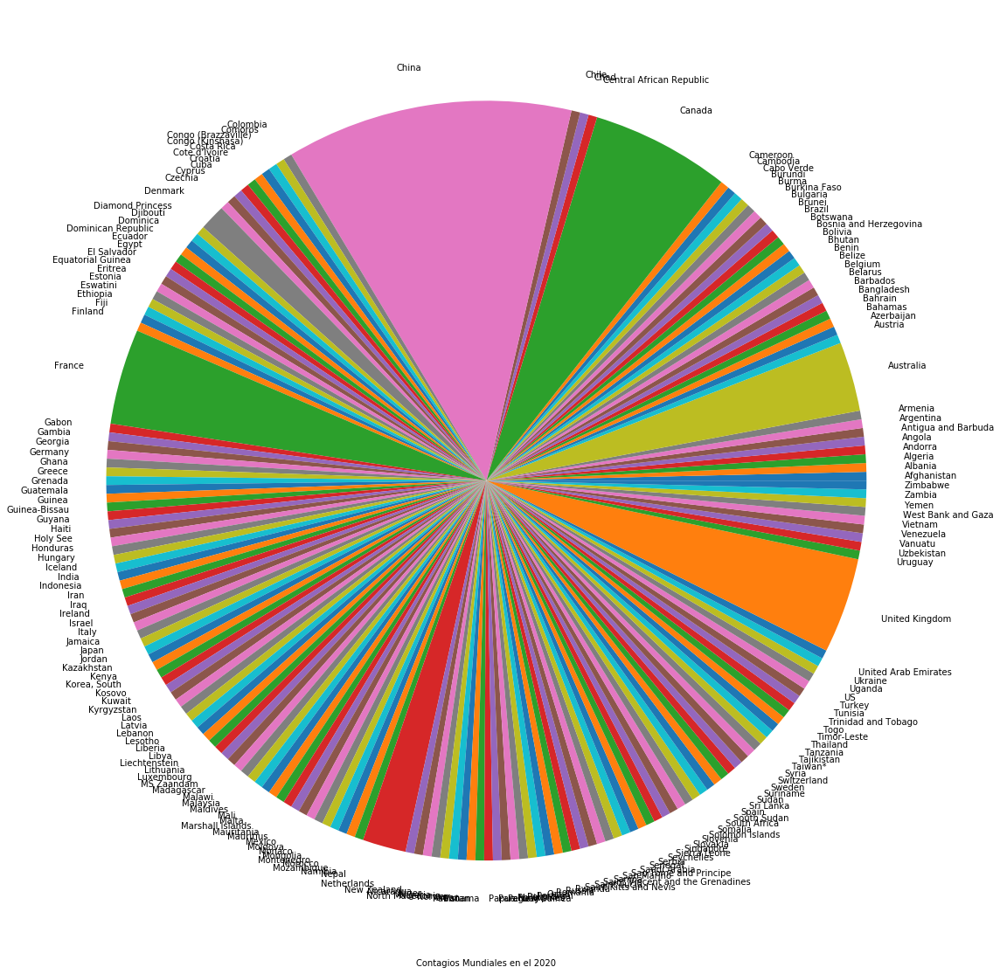

In [ ]:
df_global_sp = df_global.drop(['Province/State','Lat','Long'],axis=1)
df_global_sp['Media'] = df_global_sp.mean(axis=1)
tab = pd.crosstab(index=df_global_sp["Country/Region"],columns="Media")
plt.figure(figsize=(20,20))
plt.pie(tab,labels=tab.index)
plt.xlabel("Contagios Mundiales en el 2020")

Text(0, 0.5, 'Infectados')

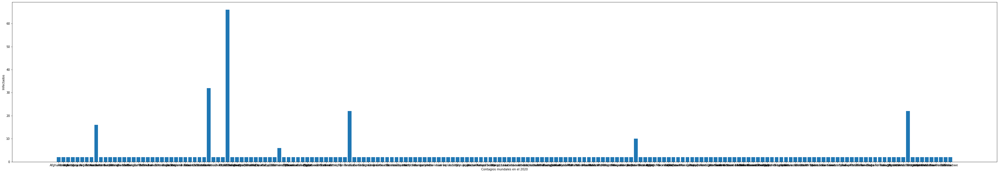

In [ ]:
tab = pd.crosstab(index=df_global_sp["Country/Region"],columns="Media")
plt.figure(figsize=(60,10))
plt.bar(tab.index,tab["Media"])
plt.xlabel("Contagios mundales en el 2020")
plt.ylabel("Infectados")

C:\Users\02R\anaconda3\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  


Text(0.5, 0, 'Contagios USA en el 2020')

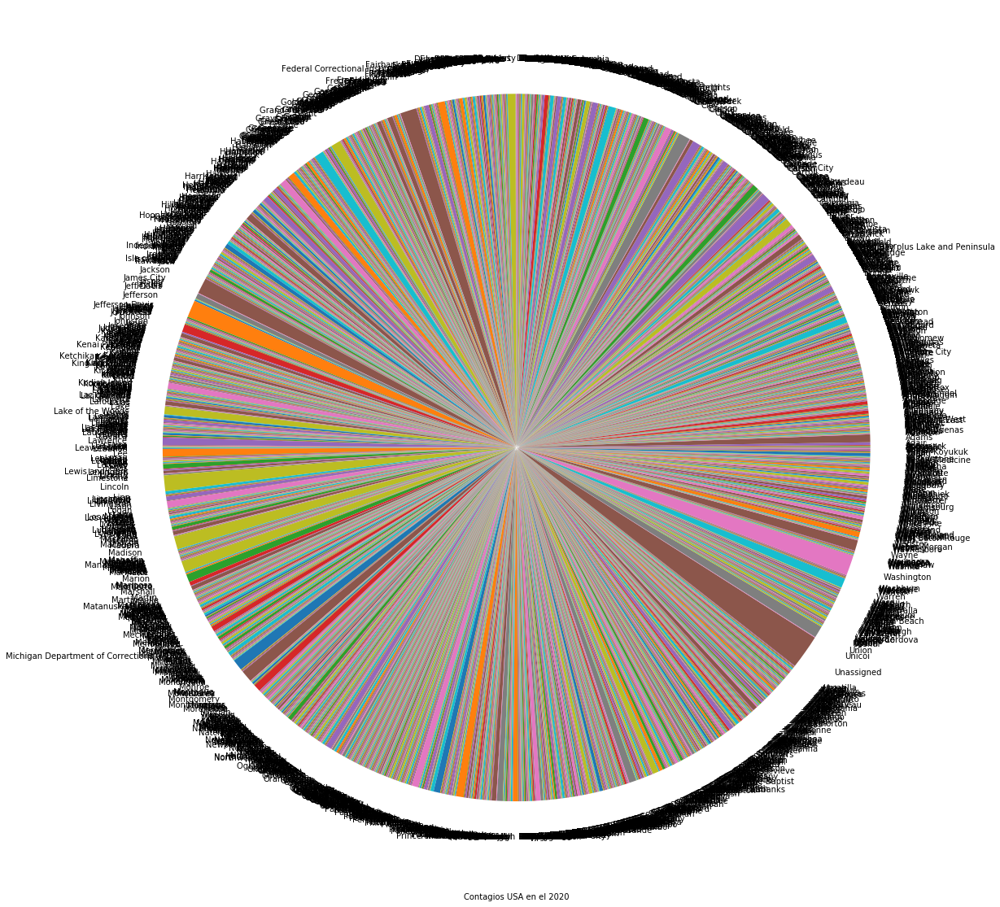

In [ ]:
#5) Realice gráficas descriptivas con Matplotlib y Plotly
df_us_sp = df_us.drop(['UID','iso2','iso3','code3','FIPS','Province_State','Country_Region','Lat','Long_','Combined_Key','Population'],axis=1)
df_us_sp['Media'] = df_us_sp.mean(axis=1)
tab = pd.crosstab(index=df_us_sp["Admin2"],columns="Media")
plt.figure(figsize=(20,20))
plt.pie(tab,labels=tab.index)
plt.xlabel("Contagios USA en el 2020")

Text(0, 0.5, 'Infectados')

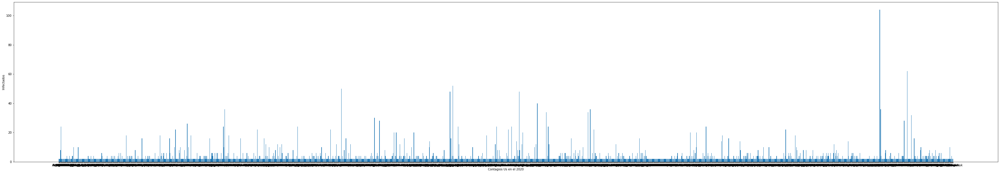

In [ ]:
tab = pd.crosstab(index=df_us_sp["Admin2"],columns="Media")
plt.figure(figsize=(60,10))
plt.bar(tab.index,tab["Media"])
plt.xlabel("Contagios Us en el 2020")
plt.ylabel("Infectados")

C:\Users\02R\anaconda3\lib\site-packages\ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  


Text(0.5, 0, 'Recuperados COVID en el 2020')

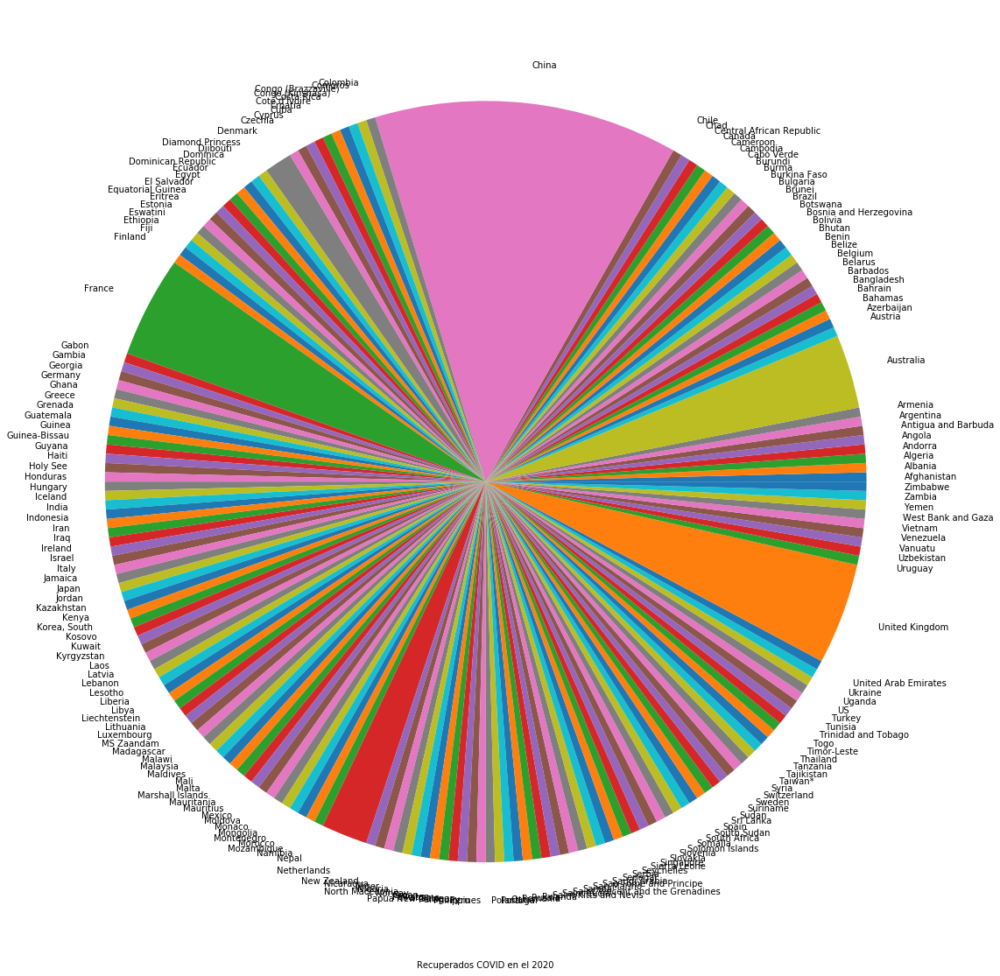

In [ ]:
#5) Realice gráficas descriptivas con Matplotlib y Plotly
df_re_sp = df_recovered.drop(['Province/State','Lat','Long'],axis=1)
df_re_sp['Media'] = df_global_sp.mean(axis=1)
tab = pd.crosstab(index=df_re_sp["Country/Region"],columns="Media")
plt.figure(figsize=(20,20))
plt.pie(tab,labels=tab.index)
plt.xlabel("Recuperados COVID en el 2020")

Text(0, 0.5, 'Recuperados')

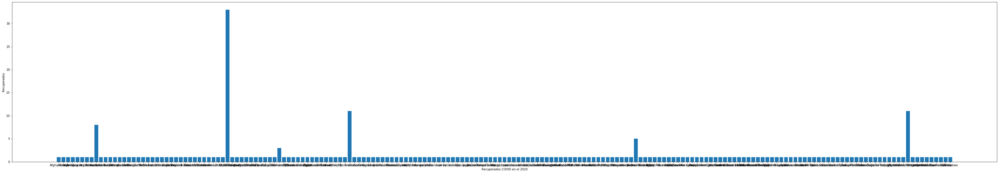

In [ ]:
tab = pd.crosstab(index=df_re_sp["Country/Region"],columns="Media")
plt.figure(figsize=(60,10))
plt.bar(tab.index,tab["Media"])
plt.xlabel("Recuperados COVID en el 2020")
plt.ylabel("Recuperados")

6) Genere una variable que agrupe los datos por pais, provincia.

Covid Global por Provincia

In [ ]:
df_global_pro = df_global.groupby(['Province/State']).mean()
df_global_pro = df_global_pro.drop(['Lat','Long'],axis=1)
df_global_pro.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
Province/State,,,,,,,,,,,,,,,,,,,,,
Alberta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,38738.0,39539.5,40409.0,41359.5,42035.5,42678.5,43479.0,44198.0,44887.0,45535.0
Anguilla,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0
Anhui,0.5,4.5,7.5,19.5,30.0,35.0,53.0,76.0,100.0,118.5,...,499.0,499.0,499.0,499.0,499.0,499.0,499.0,499.0,499.0,499.0
Aruba,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2538.5,2545.0,2547.5,2551.0,2562.5,2576.5,2585.5,2592.5,2601.0,2605.0
Australian Capital Territory,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,60.0,60.0,60.0,60.0,60.0,60.0,60.0,60.0,60.0,60.5


Covid Global por Pais

In [ ]:
df_global_pais = df_global.groupby(['Country/Region']).mean()
df_global_pais = df_global_pais.drop(['Lat','Long'],axis=1)
df_global_pais.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,11/11/20,11/12/20,11/13/20,11/14/20,11/15/20,11/16/20,11/17/20,11/18/20,11/19/20,11/20/20,11/21/20,11/22/20,11/23/20,11/24/20,11/25/20,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,...,22096.5,22194.5,22283.5,22321.5,22430.0,22551.5,22661.0,22786.0,22915.0,23014.5,23090.5,23198.0,23345.0,23444.5,23556.0,23668.5,23731.5,23798.0,23945.0,24034.5,24169.0,24279.5,24341.5,24341.5,24468.0,24590.0,24708.0,24811.0,24885.0,24994.0,25030.5,25092.5,25246.0,25343.5,25473.5,25586.0,25701.5,25825.5,25864.0,25942.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13195.5,13404.5,13653.0,13922.5,14226.5,14531.5,14881.5,15241.5,15640.0,16065.5,16440.5,16730.0,17136.0,17517.5,17843.5,18176.5,18508.0,18788.5,19211.5,19496.0,19918.0,20279.0,20676.5,21086.0,21518.5,21946.5,22302.5,22686.0,23069.5,23513.0,23920.0,24365.5,24766.5,25103.5,25514.0,25838.5,26239.5,26535.0,26808.0,27045.5
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.5,0.5,0.5,0.5,...,33175.0,33609.5,34049.5,34479.0,34916.5,35378.5,35888.5,36417.5,36938.0,37495.5,38014.5,38567.0,39080.5,39654.5,40177.0,40731.0,41270.0,41802.5,42315.5,42815.0,43299.5,43774.0,44203.5,44611.0,45001.5,45384.0,45676.0,45977.5,46284.0,46571.5,46848.0,47111.0,47349.0,47603.0,47844.0,48069.0,48286.5,48509.0,48720.0,48934.5
Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2821.0,2845.5,2900.0,2900.0,2974.0,2995.0,3013.5,3047.0,3071.0,3109.0,3141.5,3166.0,3190.0,3213.5,3252.0,3305.0,3343.0,3343.0,3394.0,3410.5,3433.0,3459.0,3490.5,3516.0,3541.5,3564.0,3581.0,3602.5,3620.0,3634.0,3657.0,3683.0,3708.5,3730.5,3730.5,3762.5,3772.5,3799.5,3820.0,3829.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6632.5,6684.0,6772.5,6848.0,6886.5,6969.5,7073.0,7127.0,7233.5,7300.5,7374.5,7415.0,7485.5,7540.0,7580.5,7630.5,7675.0,7716.0,7724.5,7743.5,7800.5,7835.0,7856.5,7923.0,7945.0,7972.5,8001.0,8042.0,8081.0,8143.5,8213.0,8263.5,8279.5,8324.5,8367.0,8393.0,8433.0,8473.0,8506.0,8515.5


Covid Global Recuperados por Provincia

In [ ]:
df_global_pro_re = df_recovered.groupby(['Province/State']).mean()
df_global_pro_re = df_global_pro_re.drop(['Lat','Long'],axis=1)
df_global_pro_re.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
Province/State,,,,,,,,,,,,,,,,,,,,,
Anguilla,0,0,0,0,0,0,0,0,0,0,...,3,3,4,4,4,4,10,10,10,10
Anhui,0,0,0,0,0,0,0,2,2,3,...,986,986,986,986,986,986,986,986,986,986
Aruba,0,0,0,0,0,0,0,0,0,0,...,4879,4890,4896,4903,4911,4919,4919,4928,4937,4957
Australian Capital Territory,0,0,0,0,0,0,0,0,0,0,...,114,114,114,114,114,114,114,114,114,114
Beijing,0,0,1,2,2,2,4,4,4,5,...,939,940,940,940,940,940,940,940,940,940


Covid Global Recuperados por Pais

In [ ]:
df_global_pais_re = df_recovered.groupby(['Country/Region']).mean()
df_global_pais_re = df_global_pais_re.drop(['Lat','Long'],axis=1)
df_global_pais_re.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,12/11/20,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,38141.0,38200.0,38250.0,38252.0,38336.0,38475.0,38505.0,38540.0,38613.0,39006.0
Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,24136.0,24520.0,24820.0,24820.0,25876.0,26381.0,26898.0,27426.0,27831.0,28121.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,59590.0,60028.0,60457.0,60888.0,61307.0,61700.0,62089.0,62487.0,62869.0,63260.0
Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6598.0,6629.0,6629.0,6706.0,6706.0,6819.0,6875.0,6919.0,6963.0,6997.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8798.0,8841.0,8898.0,8924.0,8990.0,9194.0,9266.0,9345.0,9518.0,9592.0


Covid US por State

In [ ]:
df_us_pais = df_us.groupby(['Admin2']).mean()
df_us_pais = df_us_pais.drop(['UID','code3','FIPS','Lat','Long_'],axis=1)
df_us_pais.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,Population
Admin2,,,,,,,,,,,,,,,,,,,,,
Abbeville,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,562.500,565.500,570.000,574.000,577.00,578.500,584.5,593.000,603.000,24527.00
Acadia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2287.500,2324.500,2328.500,2349.000,2364.00,2386.500,2407.0,2407.000,2433.500,62045.00
Accomack,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,753.500,757.500,760.000,772.500,777.50,784.000,788.0,794.500,802.000,32316.00
Ada,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15677.500,15756.000,15947.000,16239.500,16446.50,16715.000,16960.5,17118.500,17210.000,481587.00
Adair,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,535.375,540.625,545.875,555.875,570.25,578.125,587.0,600.625,608.125,18472.75


Covid US por Province State

In [ ]:
df_us_pro = df_us.groupby(['Province_State']).mean()
df_us_pro = df_us_pro.drop(['UID','code3','FIPS','Lat','Long_'],axis=1)
df_us_pro.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,12/12/20,12/13/20,12/14/20,12/15/20,12/16/20,12/17/20,12/18/20,12/19/20,12/20/20,Population
Province_State,,,,,,,,,,,,,,,,,,,,,
Alabama,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2151.760870,2171.978261,2188.384058,2214.905797,2245.202899,2279.630435,2318.688406,2349.949275,2368.413043,71060.652174
Alaska,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,656.016129,666.435484,673.370968,678.016129,687.967742,694.177419,702.177419,707.612903,710.564516,23598.225806
American Samoa,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,55641.000000
Arizona,0.0,0.0,0.0,0.0,0.029412,0.029412,0.029412,0.029412,0.029412,0.029412,...,12056.205882,12229.382353,12576.647059,12700.117647,12845.558824,13020.970588,13249.705882,13416.705882,13575.529412,428159.823529
Arkansas,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1215.344156,1224.980519,1234.071429,1248.142857,1263.493506,1283.474026,1302.337662,1320.162338,1330.435065,39192.259740


7) Realice mapas GeoEspaciales Descriptivos por país con GeoPandas/Folium

In [ ]:
pip install git+git://github.com/geopandas/geopandas.git

  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-bafj869h
  Running command git clone -q git://github.com/geopandas/geopandas.git /tmp/pip-req-build-bafj869h
     |████████████████████████████████| 14.8MB 322kB/s 
     |████████████████████████████████| 6.5MB 44.1MB/s 
  Created wheel for geopandas: filename=geopandas-0.8.0+83.g1a6bb42-py2.py3-none-any.whl size=975846 sha256=3ad2556ca58a66084a0558138fb070032cddcd7697e095985404aa4cef4b574c
  Stored in directory: /tmp/pip-ephem-wheel-cache-pphh8nwj/wheels/91/24/71/376c9c67192694168352afcccc2d264248f7e2cc6192997186
Successfully built geopandas


In [ ]:
#Infectados a nivel global

In [ ]:
import geopandas as gpd
import folium

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world_confirmed_data = world.merge(df_global, how='left', left_on=['name'], right_on= ['Country/Region'])
world_confirmed_data.dropna(subset=['Country/Region'])

dr_global_us = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=world_confirmed_data,
    data=world_confirmed_data,
    name='Casos Confirmados',
    columns=['iso_a3','12/20/20'],
    key_on='feature.properties.iso_a3',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    nan_fill_color='white',
    legend_name='Casos confirmados Covid-19',
).add_to(dr_global_us)
folium.LayerControl().add_to(dr_global_us)
dr_global_us

In [ ]:
#Recuperados a nivel global

In [ ]:
#df_global_pais_re
mundo = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world_confirmed_data = mundo.merge(df_recovered, how='left', left_on=['name'], right_on= ['Country/Region'])
world_confirmed_data.dropna(subset=['Country/Region'])
dr_global_rec = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=world_confirmed_data,
    data=world_confirmed_data,
    name='Casos Confirmados',
    columns=['iso_a3','12/20/20'],
    key_on='feature.properties.iso_a3',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    nan_fill_color='white',
    legend_name='Casos confirmados Covid-19',
).add_to(dr_global_rec)
folium.LayerControl().add_to(dr_global_rec)
dr_global_rec

In [ ]:
8) Realice mapas GeoEspaciales Descriptivos por Provincia con GeoPandas/Folium

In [ ]:
#df_global_pais_re
mundo = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world_confirmed_data = mundo.merge(df_global, how='left', left_on=['name'], right_on= ['Province/State'])
world_confirmed_data.dropna(subset=['Province/State'])
dr_global_rec = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=world_confirmed_data,
    data=world_confirmed_data,
    name='Casos Confirmados',
    columns=['iso_a3','12/20/20'],
    key_on='feature.properties.iso_a3',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    nan_fill_color='white',
    legend_name='Casos confirmados Covid-19',
).add_to(dr_global_rec)
folium.LayerControl().add_to(dr_global_rec)
dr_global_rec

9) Aplique KMeans para descubrir patrones de comportamiento

In [ ]:
# importando Kmeans
from sklearn.cluster import KMeans
from sklearn import datasets
# Creando el modelo
kmeans = KMeans(n_clusters=3)
kmeans.fit(df_global_pais) # Ajustando el modelo 

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

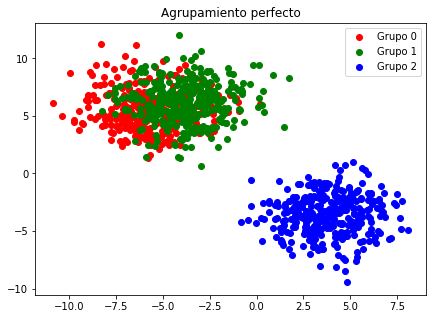

In [ ]:
# Creando el dataset
grupos, pos_correcta = datasets.make_blobs(1000, centers=3,cluster_std=1.75)
# Graficando los grupos de datos
f, ax = plt.subplots(figsize=(7, 5))
colores = ['r', 'g', 'b']
for i in [0,1,2]: 
    p = grupos[pos_correcta == i]
    ax.scatter(p[:,0], p[:,1], c=colores[i], label="Grupo {}".format(i))
ax.set_title("Agrupamiento perfecto")
ax.legend()
plt.show()

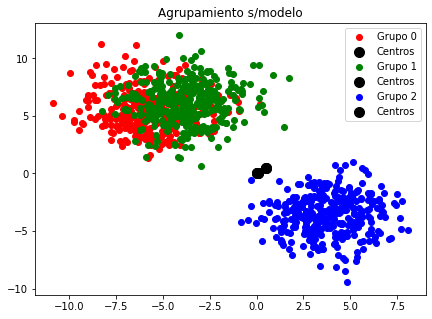

In [ ]:
# Graficando segun modelo
f, ax = plt.subplots(figsize=(7, 5))
colores = ['r', 'g', 'b']
for i in [0,1,2]:
    p = grupos[pos_correcta == i]
    ax.scatter(p[:,0], p[:,1], c=colores[i], label="Grupo {}".format(i))
    ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, color='black', label='Centros')

ax.set_title("Agrupamiento s/modelo")
ax.legend()
plt.show()